# Accident Analysis in Metro Nashville: 2013-2017 (Part 3)

### This notebook will:
* use the random data from Part 2 to create a forecasting model for accidents,
* create an interactive visualization from that model.


In [146]:
import glob
import os
import random
import pandas as pd
import matplotlib
from matplotlib import pyplot as plt
%matplotlib inline 
import datetime
import seaborn as sns
import googlemaps

import time as tm
from sklearn.model_selection import train_test_split
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_squared_error as MSE


from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets
from IPython.display import display, clear_output, Image
from plotly.graph_objs import *
from plotly.widgets import GraphWidget
from ipywidgets import Layout, Box, Label, Output
from time import gmtime, strftime, localtime

import plotly.plotly as py
import plotly

pd.options.mode.chained_assignment = None


In [147]:
%run ./'Nashville Accident Analysis -- Cleanup'.ipynb

CPU times: user 1.14 s, sys: 377 ms, total: 1.52 s
Wall time: 1.84 s


In [148]:
model_data_df = pd.read_csv('data/Random Model Data.csv')
model_data_df.drop('Unnamed: 0',axis=1,inplace=True)
model_data_df

,Weather Description_BLOWING SAND/SOIL/DIRT,Weather Description_BLOWING SNOW,Weather Description_CLEAR,Weather Description_CLOUDY,Weather Description_FOG,Weather Description_NO ADVERSE CONDITIONS,Weather Description_OTHER (NARRATIVE),Weather Description_RAIN,Weather Description_RAIN AND FOG,Weather Description_SEVERE CROSSWIND,...,Week_51,Week_52,Week_53,Weekend,Rush Hour Morning,Rush Hour Afternoon,Ramp,Intersection,Interstate,Crash Recorded
0,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
1,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
2,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0
3,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
4,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,1,0,0
5,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
6,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
7,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
8,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0
9,0,0,0,0,0,1,0,0,0,0,...,0,0,0,1,0,0,0,0,1,0


In [152]:
%%time
#### Build out random forest model

labels = np.array(model_data_df['Crash Recorded'])
model_data_df_no_labels = model_data_df.drop('Crash Recorded', axis = 1)
full_feature_list = list(model_data_df.columns)
model_data_no_labels_array = np.array(model_data_df_no_labels)

X_train, X_test, y_train, y_test = train_test_split(model_data_no_labels_array,
                                                   labels,
                                                   test_size = 0.33,
                                                   random_state = 42)

#rfc = RandomForestRegressor(n_estimators=1000, max_depth=11, random_state=2)
rfc = RandomForestClassifier(n_estimators=1000, max_depth=11, random_state=2)
rfc.fit(X_train, y_train)

y_pred = rfc.predict(X_test)



CPU times: user 4min 20s, sys: 2.15 s, total: 4min 22s
Wall time: 4min 24s


In [153]:
y_pred

array([0, 1, 0, ..., 1, 1, 0])

In [154]:
crash_probs = rfc.predict_proba(X_test)[:,1]

In [160]:
full_feature_list_rank = pd.DataFrame(list(zip(full_feature_list, rfc.feature_importances_)))

In [161]:
top_25_features = full_feature_list_rank.sort_values(1,ascending=False).head(25)
top_25_features

,0,1
206,Interstate,0.099321
5,Weather Description_NO ADVERSE CONDITIONS,0.067872
204,Ramp,0.052739
7,Weather Description_RAIN,0.025476
192,Week_45,0.019443
202,Rush Hour Morning,0.017873
203,Rush Hour Afternoon,0.016563
17,Precinct_MIDTOW,0.015775
2,Weather Description_CLEAR,0.015340
45,Zip_37210.0,0.014683


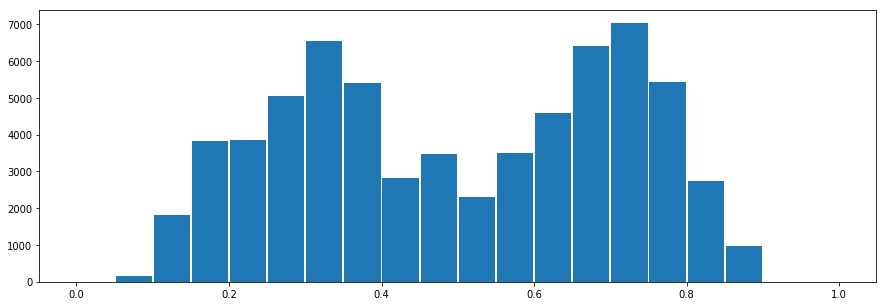

In [157]:
plt.figure(figsize=[15,5])
plt.hist(crash_probs,bins=20, range=[0,1], rwidth=.95)
plt.show()
#TODO: PRETTY THIS GRAPH UP

In [158]:
#mse_dt = MSE(y_pred, y_test)
mse_dt = MSE(crash_probs, y_test)

rmse_dt = mse_dt**(1/2)

print("Test set RMSE of rfc: {:.2f}".format(rmse_dt))

Test set RMSE of rfc: 0.33


#### Re-run using only the top 25 features

In [162]:
%%time
#### Build out random forest model
labels = np.array(model_data_df['Crash Recorded'])
model_data_df_no_labels = model_data_df.drop('Crash Recorded', axis = 1)
top_25_feature_list = top_25_features[0]
model_data_no_labels_array = np.array(model_data_df_no_labels.loc[:,top_25_feature_list])

X_train, X_test, y_train, y_test = train_test_split(model_data_no_labels_array,
                                                   labels,
                                                   test_size = 0.33,
                                                   random_state = 42)

#rfc = RandomForestRegressor(n_estimators=1000, max_depth=11, random_state=2)
rfc = RandomForestClassifier(n_estimators=1000, max_depth=11, random_state=2)
rfc.fit(X_train, y_train)

y_pred = rfc.predict(X_test)



In [163]:
y_pred

array([0, 1, 0, ..., 1, 1, 0])

In [164]:
crash_probs = rfc.predict_proba(X_test)[:,1]

In [165]:
top_25_feature_list_rank = pd.DataFrame(list(zip(top_25_feature_list, rfc.feature_importances_)))

In [166]:
top_25_feature_list_rank.sort_values(1,ascending=False).head(25)

,0,1
0,Interstate,0.131067
1,Weather Description_NO ADVERSE CONDITIONS,0.092752
2,Ramp,0.064593
5,Rush Hour Morning,0.050610
16,Intersection,0.045021
8,Weather Description_CLEAR,0.044047
7,Precinct_MIDTOW,0.043141
17,Day Of Week_3,0.038573
20,Precinct_SOUTH,0.038263
18,Day Of Week_2,0.037150


In [167]:
#mse_dt = MSE(y_pred, y_test)
mse_dt = MSE(crash_probs, y_test)

rmse_dt = mse_dt**(1/2)

print("Test set RMSE of rfc: {:.2f}".format(rmse_dt))

Test set RMSE of rfc: 0.30


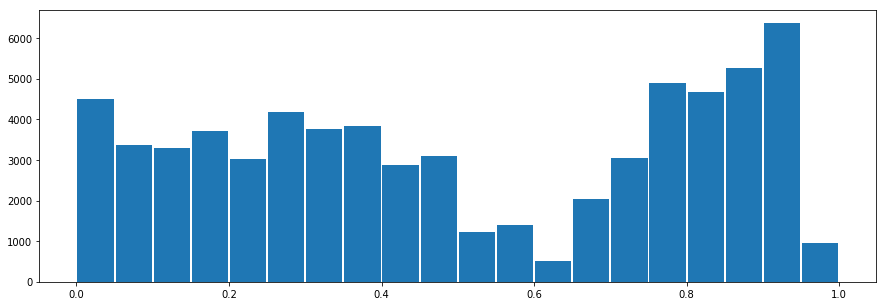

In [168]:
plt.figure(figsize=[15,5])
plt.hist(crash_probs,bins=20, range=[0,1], rwidth=.95)
plt.show()
#TODO: PRETTY THIS GRAPH UP

In [169]:
#feature_list = feature_list[:-1]
new_df = pd.DataFrame(X_test, columns=top_25_feature_list)
new_df['Crash Recorded'] = y_test
#new_df['Crash Forecast'] = y_pred
new_df['Crash Forecast'] = crash_probs
new_df

,Interstate,Weather Description_NO ADVERSE CONDITIONS,Ramp,Weather Description_RAIN,Week_45,Rush Hour Morning,Rush Hour Afternoon,Precinct_MIDTOW,Weather Description_CLEAR,Zip_37210.0,...,Day Of Week_3,Day Of Week_2,Day Of Month_2,Precinct_SOUTH,Day Of Week_4,Hour_13,Month_11,Month_5,Crash Recorded,Crash Forecast
0,0,1,0,0,0,1,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0.146464
1,0,0,0,0,0,0,1,0,1,0,...,1,0,0,1,0,0,0,0,1,0.851083
2,0,0,0,0,0,1,0,0,1,0,...,0,1,0,0,0,0,0,0,0,0.347596
3,1,0,1,0,0,0,0,0,1,1,...,0,1,0,0,0,0,0,0,1,0.853138
4,0,0,0,0,0,0,1,0,1,0,...,0,1,0,0,0,0,0,0,0,0.576542
5,1,0,1,0,0,0,0,0,1,1,...,0,1,0,0,0,0,0,0,1,0.853138
6,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,1,0.364544
7,1,0,1,0,0,1,0,0,1,1,...,0,0,0,0,1,0,0,0,0,0.391286
8,1,1,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,1,0.845095
9,0,0,0,0,0,0,0,0,0,1,...,0,1,0,0,0,1,0,0,1,0.781682


In [101]:
# what happens if we just predicted no crashes?
y_pred = np.zeros(len(y_test))

In [102]:
mse_dt = MSE(y_pred, y_test)

rmse_dt = mse_dt**(1/2)

# Print rmse_dt
print("Test set RMSE of rfc: {:.2f}".format(rmse_dt))

Test set RMSE of rfc: 0.71


In [103]:
# what happens if we just predicted all crashes?
y_pred = np.ones(len(y_test))

In [104]:
mse_dt = MSE(y_pred, y_test)

rmse_dt = mse_dt**(1/2)

# Print rmse_dt
print("Test set RMSE of rfc: {:.2f}".format(rmse_dt))

Test set RMSE of rfc: 0.70


In [105]:
# what happens if we just randomly guessed 1 or 0?
y_pred = np.random.randint(2, size=(len(y_test)))
y_pred

array([1, 1, 1, ..., 0, 1, 1])

In [106]:
mse_dt = MSE(y_pred, y_test)

rmse_dt = mse_dt**(1/2)

# Print rmse_dt
print("Test set RMSE of rfc: {:.2f}".format(rmse_dt))

Test set RMSE of rfc: 0.71


In [107]:
# what happens if we just randomly .5 every time?
y_pred = np.full((len(y_test),1), .5)
y_pred

array([[0.5],
       [0.5],
       [0.5],
       ...,
       [0.5],
       [0.5],
       [0.5]])

In [108]:
mse_dt = MSE(y_pred, y_test)

rmse_dt = mse_dt**(1/2)

# Print rmse_dt
print("Test set RMSE of rfc: {:.2f}".format(rmse_dt))

Test set RMSE of rfc: 0.50


### To see how well my model is doing, I'll pick a random time and pair it with every location and see how many crashes are predicted.

In [170]:
random_time = pd.to_datetime('2015-04-10 16:00:00')

#crash_data_df['Date and Time'] = pd.to_datetime(crash_data_df['Date and Time'])

In [171]:
real_crashes_at_test_time_df = non_empty_crash_data_df[non_empty_crash_data_df['Rounded Date and Time'] == random_time]
real_crashes_at_test_time_df

,Accident Number,Date and Time,Number of Motor Vehicles,Number of Injuries,Number of Fatalities,Property Damage,Hit and Run,Reporting Officer,Collision Type,Collision Type Description,...,Month,Hour,Year,Week,Weekend,Rush Hour Morning,Rush Hour Afternoon,Ramp,Intersection,Interstate
62759,20150333788,2015-04-10 16:35:00,1.0,0.0,0.0,N,N,169425,0.0,NOT COLLISION W/MOTOR VEHICLE-TRANSPORT,...,4,16,2015,15,0,0,1,0,1,0
62859,20150337201,2015-04-10 16:06:00,3.0,0.0,0.0,N,N,909485,11.0,Front to Rear,...,4,16,2015,15,0,0,1,0,0,1
62861,20150337223,2015-04-10 16:00:00,2.0,0.0,0.0,N,N,807319,4.0,ANGLE,...,4,16,2015,15,0,0,1,0,1,0
62862,20150337227,2015-04-10 16:16:00,2.0,0.0,0.0,N,N,909489,4.0,ANGLE,...,4,16,2015,15,0,0,1,0,1,0
62865,20150337249,2015-04-10 16:20:00,2.0,0.0,0.0,N,N,169423,11.0,Front to Rear,...,4,16,2015,15,0,0,1,0,0,1
62866,20150337254,2015-04-10 16:01:00,4.0,1.0,0.0,N,Y,151129,11.0,Front to Rear,...,4,16,2015,15,0,0,1,0,0,1
62867,20150337274,2015-04-10 16:25:00,3.0,1.0,0.0,N,N,110081,2.0,HEAD-ON,...,4,16,2015,15,0,0,1,0,1,0
62869,20150337291,2015-04-10 16:33:00,1.0,0.0,0.0,Y,N,151139,0.0,NOT COLLISION W/MOTOR VEHICLE-TRANSPORT,...,4,16,2015,15,0,0,1,0,1,0
62870,20150337316,2015-04-10 16:39:00,2.0,0.0,0.0,N,N,110068,4.0,ANGLE,...,4,16,2015,15,0,0,1,0,1,0
62871,20150337325,2015-04-10 16:40:00,2.0,0.0,0.0,N,N,887592,11.0,Front to Rear,...,4,16,2015,15,0,0,1,0,0,1


In [172]:
print('****Looks like there were', real_crashes_at_test_time_df.shape[0] ,'crashes across the county during this hour.****')

****Looks like there were 17 crashes across the county during this hour.****


#### Create a dataframe that has every location and  street address

In [319]:
forecast_map_df = pd.DataFrame({'Location': non_empty_crash_data_df['Location'], 
                                'Street Address': non_empty_crash_data_df['Street Address'],
                                'Zip': non_empty_crash_data_df['Zip'],
                                'Precinct': non_empty_crash_data_df['Precinct'], 
                                'Zip': non_empty_crash_data_df['Zip'], 
                                'City': non_empty_crash_data_df['City']
                               })
forecast_map_df.drop_duplicates(subset='Location',keep='first',inplace=True)

In [320]:
forecast_map_df['Rounded Date and Time'] = random_time
forecast_map_df['Weather Description'] = 'CLEAR'
extract_time_features(forecast_map_df)
extract_address_features(forecast_map_df)

forecast_map_df

,Location,Street Address,Zip,Precinct,City,Rounded Date and Time,Weather Description,Day Of Week,Day Of Month,Month,Hour,Year,Week,Weekend,Rush Hour Morning,Rush Hour Afternoon,Ramp,Intersection,Interstate
0,"(36.175273062828005, -86.7926580298143)",MONROE ST & ROSA L PARKS BLVD,37208.0,NORTH,NASHVILLE,2015-04-10 16:00:00,CLEAR,4,10,4,16,2015,15,0,0,1,0,1,0
1,"(36.04522, -86.6591)",BELL RD & I 24 E,37013.0,SOUTH,ANTIOCH,2015-04-10 16:00:00,CLEAR,4,10,4,16,2015,15,0,0,1,0,1,1
2,"(36.0447764026146, -86.6615277299611)",BELL RD & CANE RIDGE RD,37013.0,SOUTH,ANTIOCH,2015-04-10 16:00:00,CLEAR,4,10,4,16,2015,15,0,0,1,0,1,0
3,"(36.2179868590007, -86.84240625543941)",3810 KINGS LN,37218.0,NORTH,NASHVILLE,2015-04-10 16:00:00,CLEAR,4,10,4,16,2015,15,0,0,1,0,0,0
4,"(36.12465, -86.69971)",1306 VULTEE BLVD,37217.0,HERMIT,NASHVILLE,2015-04-10 16:00:00,CLEAR,4,10,4,16,2015,15,0,0,1,0,0,0
5,"(36.1559017029874, -86.78301295923691)",1011 DEMONBREUN ST,37203.0,CENTRA,NASHVILLE,2015-04-10 16:00:00,CLEAR,4,10,4,16,2015,15,0,0,1,0,0,0
6,"(36.1579519522797, -86.78430846433528)",10TH AVE N & BROADWAY,37203.0,CENTRA,NASHVILLE,2015-04-10 16:00:00,CLEAR,4,10,4,16,2015,15,0,0,1,0,1,0
7,"(36.195, -86.70599)",2705 TRAUGHBER DR,37216.0,EAST,NASHVILLE,2015-04-10 16:00:00,CLEAR,4,10,4,16,2015,15,0,0,1,0,0,0
8,"(36.1537926678066, -86.79441039786231)",17TH AVE S & WEST END AVE,37203.0,MIDTOW,NASHVILLE,2015-04-10 16:00:00,CLEAR,4,10,4,16,2015,15,0,0,1,0,1,0
9,"(36.2302139748994, -86.7899822394164)",ALDRICH LN & CORNISH DR,37207.0,NORTH,NASHVILLE,2015-04-10 16:00:00,CLEAR,4,10,4,16,2015,15,0,0,1,0,1,0


In [321]:
map_model_df = forecast_map_df.drop(['Location','Street Address','Rounded Date and Time','Year'],axis=1)

In [322]:
map_model_df

,Zip,Precinct,City,Weather Description,Day Of Week,Day Of Month,Month,Hour,Week,Weekend,Rush Hour Morning,Rush Hour Afternoon,Ramp,Intersection,Interstate
0,37208.0,NORTH,NASHVILLE,CLEAR,4,10,4,16,15,0,0,1,0,1,0
1,37013.0,SOUTH,ANTIOCH,CLEAR,4,10,4,16,15,0,0,1,0,1,1
2,37013.0,SOUTH,ANTIOCH,CLEAR,4,10,4,16,15,0,0,1,0,1,0
3,37218.0,NORTH,NASHVILLE,CLEAR,4,10,4,16,15,0,0,1,0,0,0
4,37217.0,HERMIT,NASHVILLE,CLEAR,4,10,4,16,15,0,0,1,0,0,0
5,37203.0,CENTRA,NASHVILLE,CLEAR,4,10,4,16,15,0,0,1,0,0,0
6,37203.0,CENTRA,NASHVILLE,CLEAR,4,10,4,16,15,0,0,1,0,1,0
7,37216.0,EAST,NASHVILLE,CLEAR,4,10,4,16,15,0,0,1,0,0,0
8,37203.0,MIDTOW,NASHVILLE,CLEAR,4,10,4,16,15,0,0,1,0,1,0
9,37207.0,NORTH,NASHVILLE,CLEAR,4,10,4,16,15,0,0,1,0,1,0


In [323]:
df_temp = forecast_map_df.loc[:,['Weather Description', 'Precinct', 'Zip', 'City', 'Day Of Week', 'Day Of Month',
            'Month', 'Hour', 'Week']].astype('category')
df_temp_2 = forecast_map_df.loc[:,['Weekend', 'Rush Hour Morning', 'Rush Hour Afternoon', 'Ramp',
        'Intersection', 'Interstate']]
df_temp = pd.get_dummies(df_temp)
map_model_df = pd.concat([df_temp, df_temp_2],axis=1)

In [324]:
map_model_df
# I need to find the columns I'm missing from the full feature set and bring them in here 
# (populated with 0s), and then filter down to the top 25

,Weather Description_CLEAR,Precinct_CENTRA,Precinct_EAS,Precinct_EAST,Precinct_HERMIT,Precinct_MADISO,Precinct_MIDTOW,Precinct_NORT,Precinct_NORTH,Precinct_SOUT,...,Day Of Month_10,Month_4,Hour_16,Week_15,Weekend,Rush Hour Morning,Rush Hour Afternoon,Ramp,Intersection,Interstate
0,1,0,0,0,0,0,0,0,1,0,...,1,1,1,1,0,0,1,0,1,0
1,1,0,0,0,0,0,0,0,0,0,...,1,1,1,1,0,0,1,0,1,1
2,1,0,0,0,0,0,0,0,0,0,...,1,1,1,1,0,0,1,0,1,0
3,1,0,0,0,0,0,0,0,1,0,...,1,1,1,1,0,0,1,0,0,0
4,1,0,0,0,1,0,0,0,0,0,...,1,1,1,1,0,0,1,0,0,0
5,1,1,0,0,0,0,0,0,0,0,...,1,1,1,1,0,0,1,0,0,0
6,1,1,0,0,0,0,0,0,0,0,...,1,1,1,1,0,0,1,0,1,0
7,1,0,0,1,0,0,0,0,0,0,...,1,1,1,1,0,0,1,0,0,0
8,1,0,0,0,0,0,1,0,0,0,...,1,1,1,1,0,0,1,0,1,0
9,1,0,0,0,0,0,0,0,1,0,...,1,1,1,1,0,0,1,0,1,0


In [325]:
current_cols = list(map_model_df.columns)


#list_1 = ["a", "b", "c", "d", "e"]
#list_2 = ["a", "f", "c", "m"] 
missing_features = np.setdiff1d(full_feature_list, current_cols)
missing_features

blank_features_df = pd.DataFrame(columns=missing_features)
test_map_model_df = pd.concat([map_model_df, blank_features_df], axis=1)

test_map_model_df.fillna(0, inplace=True)

test_map_model_df = test_map_model_df.loc[:,top_25_feature_list]

test_map_model_df

#new_feature_list = list(set(list(top_25_feature_list) + current_cols))
#top_25_feature_list.extend(current_cols)
#new_feature_list

,Interstate,Weather Description_NO ADVERSE CONDITIONS,Ramp,Weather Description_RAIN,Week_45,Rush Hour Morning,Rush Hour Afternoon,Precinct_MIDTOW,Weather Description_CLEAR,Zip_37210.0,...,Weather Description_CLOUDY,Intersection,Day Of Week_3,Day Of Week_2,Day Of Month_2,Precinct_SOUTH,Day Of Week_4,Hour_13,Month_11,Month_5
0,0,0,0,0,0,0,1,0,1,0,...,0,1,0,0,0,0,1,0,0,0
1,1,0,0,0,0,0,1,0,1,0,...,0,1,0,0,0,1,1,0,0,0
2,0,0,0,0,0,0,1,0,1,0,...,0,1,0,0,0,1,1,0,0,0
3,0,0,0,0,0,0,1,0,1,0,...,0,0,0,0,0,0,1,0,0,0
4,0,0,0,0,0,0,1,0,1,0,...,0,0,0,0,0,0,1,0,0,0
5,0,0,0,0,0,0,1,0,1,0,...,0,0,0,0,0,0,1,0,0,0
6,0,0,0,0,0,0,1,0,1,0,...,0,1,0,0,0,0,1,0,0,0
7,0,0,0,0,0,0,1,0,1,0,...,0,0,0,0,0,0,1,0,0,0
8,0,0,0,0,0,0,1,1,1,0,...,0,1,0,0,0,0,1,0,0,0
9,0,0,0,0,0,0,1,0,1,0,...,0,1,0,0,0,0,1,0,0,0


In [326]:
#blank_features_df = pd.DataFrame(columns=full_feature_list)

#test_map_model_df = pd.concat([map_model_df, blank_features_df], axis=1)
#test_map_model_df
#more_cols = pd.DataFrame(columns=feature_list)

In [327]:
#test_map_model_df['Weather Description_CLEAR']

In [328]:
test_map_model_df.columns

Index(['Interstate', 'Weather Description_NO ADVERSE CONDITIONS', 'Ramp',
       'Weather Description_RAIN', 'Week_45', 'Rush Hour Morning',
       'Rush Hour Afternoon', 'Precinct_MIDTOW', 'Weather Description_CLEAR',
       'Zip_37210.0', 'Day Of Month_6', 'Month_9', 'Weekend', 'Week_5',
       'Zip_37207.0', 'Weather Description_CLOUDY', 'Intersection',
       'Day Of Week_3', 'Day Of Week_2', 'Day Of Month_2', 'Precinct_SOUTH',
       'Day Of Week_4', 'Hour_13', 'Month_11', 'Month_5'],
      dtype='object')

In [329]:
#forecast_map_df.columns
#map_model_df

In [330]:
#predictions = rfc.predict(map_model_df)
predictions = rfc.predict_proba(test_map_model_df)[:,1]

In [331]:
predictions

array([0.28804262, 0.26422794, 0.25823765, ..., 0.28804262, 0.28804262,
       0.28804262])

In [332]:
forecast_map_df['Crash Forecast'] = predictions

In [333]:
forecast_map_df.shape

(36023, 20)

In [334]:
forecast_map_df['Longitude'] = [loc[1] for loc in forecast_map_df['Location']]
forecast_map_df['Latitude'] = [loc[0] for loc in forecast_map_df['Location']]
#forecast_map_df

In [335]:
forecast_map_df.loc[:,['Latitude','Longitude','Street Address']]

,Latitude,Longitude,Street Address
0,36.175273,-86.792658,MONROE ST & ROSA L PARKS BLVD
1,36.045220,-86.659100,BELL RD & I 24 E
2,36.044776,-86.661528,BELL RD & CANE RIDGE RD
3,36.217987,-86.842406,3810 KINGS LN
4,36.124650,-86.699710,1306 VULTEE BLVD
5,36.155902,-86.783013,1011 DEMONBREUN ST
6,36.157952,-86.784308,10TH AVE N & BROADWAY
7,36.195000,-86.705990,2705 TRAUGHBER DR
8,36.153793,-86.794410,17TH AVE S & WEST END AVE
9,36.230214,-86.789982,ALDRICH LN & CORNISH DR


In [336]:
import plotly as py
import plotly.graph_objs as go
from plotly.tools import FigureFactory as FF
import json


In [337]:
with open('keys.json') as keys:    
    api_keys = json.load(keys)

In [338]:
mapbox_access_token = api_keys['map_key']
py.tools.set_credentials_file(username='evanplancaster', api_key=mapbox_access_token)
py.offline.init_notebook_mode(connected=True)

In [339]:
scl = [ [0,"rgb(255, 255, 255)"],[0.4,"rgb(233, 255, 0)"],[1,"rgb(255, 0, 0)"] ]

data = [
    go.Scattermapbox(
        lat=forecast_map_df['Latitude'],
        lon=forecast_map_df['Longitude'],
        mode='markers',
        marker = dict(
            size = 8,
            opacity = 0.7,
            #reversescale = True,
            autocolorscale = False,
            #symbol = 'square',
            colorscale = scl,
            cmin = 0,
            color = forecast_map_df['Crash Forecast'],
            cmax = 1,
            colorbar=dict(
                title="Accident Probability"
            )
        ),
        text=forecast_map_df['Street Address'],
        hoverinfo = 'text'
    )
]

layout = go.Layout(
    width=1000,
    height=800,
    autosize=True,
    hovermode='closest',
    mapbox=dict(
        accesstoken=mapbox_access_token,
        bearing=0,
        center=dict(
            lat=36.162700, 
            lon=-86.781600
        ),
        pitch=0,
        zoom=9
    ),
)

fig = dict(data=data, layout=layout)
plotly.offline.iplot(fig, filename='Multiple Mapbox')

#### Not too shabby. Now to create a forecast map based on the next four hours.

In [340]:
current_time = pd.to_datetime(str(localtime(tm.time()).tm_year) + '-' +
                            str(localtime(tm.time()).tm_mon) + '-' +
                             str(localtime(tm.time()).tm_mday) + ' ' +
                             str(localtime(tm.time()).tm_hour) + ':00:00')

current_hour = current_time.hour
next_four_hours = [(current_hour + i) % 24 for i in range(4)]

In [341]:
four_hr_forecast_df = pd.DataFrame()
for i in range(4):
    
    temp_df = pd.DataFrame({'Location': non_empty_crash_data_df['Location'], 
                            'Street Address': non_empty_crash_data_df['Street Address'],
                            'Zip': non_empty_crash_data_df['Zip'],
                            'Precinct': non_empty_crash_data_df['Precinct'], 
                            'Zip': non_empty_crash_data_df['Zip'], 
                            'City': non_empty_crash_data_df['City']
                           })
    temp_df.drop_duplicates(subset='Location',keep='first',inplace=True)
    
    temp_df['Rounded Date and Time'] = pd.to_datetime(str(localtime(tm.time()).tm_year) + '-' +
                            str(localtime(tm.time()).tm_mon) + '-' +
                             str(localtime(tm.time()).tm_mday) + ' ' +
                             str(localtime(tm.time()).tm_hour + i) + ':00:00')
    
    #NOTE TO SELF!!!! REPLACE WITH FORECAST!!!!!
    temp_df['Weather Description'] = 'RAIN'
    
    extract_time_features(temp_df)
    extract_address_features(temp_df)
    
    #temp_df = temp_df.drop(['Location','Street Address','Rounded Date and Time','Year'],axis=1)
    four_hr_forecast_df = four_hr_forecast_df.append(temp_df)
    
#four_hr_forecast_df = temp_df.drop(['Location','Street Address','Rounded Date and Time','Year'],axis=1)

In [342]:
df_temp = four_hr_forecast_df.loc[:,['Weather Description', 'Precinct', 'Zip', 'City', 'Day Of Week', 'Day Of Month',
            'Month', 'Hour', 'Week']].astype('category')
df_temp_2 = four_hr_forecast_df.loc[:,['Weekend', 'Rush Hour Morning', 'Rush Hour Afternoon', 'Ramp',
        'Intersection', 'Interstate']]
df_temp = pd.get_dummies(df_temp)

temp_four_hr_forecast_df = pd.concat([df_temp, df_temp_2],axis=1)

current_cols = list(temp_four_hr_forecast_df.columns)

missing_features = np.setdiff1d(full_feature_list, current_cols)

blank_features_df = pd.DataFrame(columns=missing_features)
test_map_model_df = pd.concat([temp_four_hr_forecast_df, blank_features_df], axis=1)

test_map_model_df.fillna(0, inplace=True)

test_map_model_df = test_map_model_df.loc[:,top_25_feature_list]

test_map_model_df

#new_feature_list = list(set(list(top_25_feature_list) + current_cols))
#top_25_feature_list.extend(current_cols)
#new_feature_list

,Interstate,Weather Description_NO ADVERSE CONDITIONS,Ramp,Weather Description_RAIN,Week_45,Rush Hour Morning,Rush Hour Afternoon,Precinct_MIDTOW,Weather Description_CLEAR,Zip_37210.0,...,Weather Description_CLOUDY,Intersection,Day Of Week_3,Day Of Week_2,Day Of Month_2,Precinct_SOUTH,Day Of Week_4,Hour_13,Month_11,Month_5
0,0,0,0,1,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
1,1,0,0,1,0,0,0,0,0,0,...,0,1,0,0,0,1,0,1,0,0
2,0,0,0,1,0,0,0,0,0,0,...,0,1,0,0,0,1,0,1,0,0
3,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
4,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
5,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
6,0,0,0,1,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
7,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
8,0,0,0,1,0,0,0,1,0,0,...,0,1,0,0,0,0,0,1,0,0
9,0,0,0,1,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0


In [343]:
#model_df = four_hr_forecast_df.drop(['Location','Street Address','Rounded Date and Time','Year'],axis=1)

In [344]:
#predictions = rfc.predict(map_model_df)
predictions = rfc.predict_proba(test_map_model_df)[:,1]

In [345]:
predictions

array([0.44017177, 0.23490943, 0.3081771 , ..., 0.46068856, 0.46068856,
       0.46068856])

In [346]:
four_hr_forecast_df['Crash Forecast'] = predictions


In [347]:
four_hr_forecast_df

,Location,Street Address,Zip,Precinct,City,Rounded Date and Time,Weather Description,Day Of Week,Day Of Month,Month,Hour,Year,Week,Weekend,Rush Hour Morning,Rush Hour Afternoon,Ramp,Intersection,Interstate,Crash Forecast
0,"(36.175273062828005, -86.7926580298143)",MONROE ST & ROSA L PARKS BLVD,37208.0,NORTH,NASHVILLE,2018-07-21 13:00:00,RAIN,5,21,7,13,2018,29,1,0,0,0,1,0,0.440172
1,"(36.04522, -86.6591)",BELL RD & I 24 E,37013.0,SOUTH,ANTIOCH,2018-07-21 13:00:00,RAIN,5,21,7,13,2018,29,1,0,0,0,1,1,0.234909
2,"(36.0447764026146, -86.6615277299611)",BELL RD & CANE RIDGE RD,37013.0,SOUTH,ANTIOCH,2018-07-21 13:00:00,RAIN,5,21,7,13,2018,29,1,0,0,0,1,0,0.308177
3,"(36.2179868590007, -86.84240625543941)",3810 KINGS LN,37218.0,NORTH,NASHVILLE,2018-07-21 13:00:00,RAIN,5,21,7,13,2018,29,1,0,0,0,0,0,0.255057
4,"(36.12465, -86.69971)",1306 VULTEE BLVD,37217.0,HERMIT,NASHVILLE,2018-07-21 13:00:00,RAIN,5,21,7,13,2018,29,1,0,0,0,0,0,0.255057
5,"(36.1559017029874, -86.78301295923691)",1011 DEMONBREUN ST,37203.0,CENTRA,NASHVILLE,2018-07-21 13:00:00,RAIN,5,21,7,13,2018,29,1,0,0,0,0,0,0.255057
6,"(36.1579519522797, -86.78430846433528)",10TH AVE N & BROADWAY,37203.0,CENTRA,NASHVILLE,2018-07-21 13:00:00,RAIN,5,21,7,13,2018,29,1,0,0,0,1,0,0.440172
7,"(36.195, -86.70599)",2705 TRAUGHBER DR,37216.0,EAST,NASHVILLE,2018-07-21 13:00:00,RAIN,5,21,7,13,2018,29,1,0,0,0,0,0,0.255057
8,"(36.1537926678066, -86.79441039786231)",17TH AVE S & WEST END AVE,37203.0,MIDTOW,NASHVILLE,2018-07-21 13:00:00,RAIN,5,21,7,13,2018,29,1,0,0,0,1,0,0.181962
9,"(36.2302139748994, -86.7899822394164)",ALDRICH LN & CORNISH DR,37207.0,NORTH,NASHVILLE,2018-07-21 13:00:00,RAIN,5,21,7,13,2018,29,1,0,0,0,1,0,0.317217


In [348]:
four_hr_forecast_df['Longitude'] = [loc[1] for loc in four_hr_forecast_df['Location']]
four_hr_forecast_df['Latitude'] = [loc[0] for loc in four_hr_forecast_df['Location']]


In [349]:
four_hr_forecast_df.to_csv('data/Four_Hour_Forecast.csv')

#### Create the widgets for slicing the data

In [276]:
next_four_hours_pretty = [str(x)+':00' for x in next_four_hours]

In [277]:
slider_hour = widgets.SelectionSlider(
    options=next_four_hours,
    value=next_four_hours[0],
    description='Next four hours: ',
    disabled=False,
    continuous_update=False,
    orientation='horizontal',
    readout=False
)

#### Define the slicing functions that are used in the widgets

In [278]:
def update_hour_df(df, x) :
    slice_by_hour = df[df['Hour'] == x]
    return slice_by_hour


#### Define the function that creates the map based on the sliced dataframe

In [279]:
def df_map(x):
    scl = [ [0,"rgb(255, 255, 255)"],[0.4,"rgb(233, 255, 0)"],[1,"rgb(255, 0, 0)"] ]

    sliced_df = four_hr_forecast_df[four_hr_forecast_df['Hour'] == x]
    
    data = [
        go.Scattermapbox(
            lat=sliced_df['Latitude'],
            lon=sliced_df['Longitude'],
            mode='markers',
            marker = dict(
                size = 8,
                opacity = 0.7,
                #reversescale = True,
                autocolorscale = False,
                #symbol = 'square',
                colorscale = scl,
                cmin = 0,
                color = sliced_df['Crash Forecast'],
                cmax = 1,
                colorbar=dict(
                    title="Accident Probability"
                )
            ),
            text=sliced_df['Street Address'],
            hoverinfo = 'text'
        )
    ]

    layout = go.Layout(
        width=1000,
        height=800,
        autosize=True,
        hovermode='closest',
        mapbox=dict(
            accesstoken=mapbox_access_token,
            bearing=0,
            center=dict(
                lat=36.162700, 
                lon=-86.781600
            ),
            pitch=0,
            zoom=9
        ),
    )

    fig = dict(data=data, layout=layout)
    plotly.offline.iplot(fig, filename='Multiple Mapbox')

#### Create display components for the application

In [280]:
%%capture
# Create the output object for the map object and the widgets
out1 = widgets.interact(df_map, 
                              x=slider_hour)

rendered_map = out1.widget.children[-1]

In [281]:
widgets_layout = Layout(display='flex',
                    flex_flow='column',
                    align_items='center',
                    border='solid 1px',
                    width='100%',
                    padding='10px')

viz_layout = Layout(display='flex',
                    flex_flow='column',
                    align_items='center',
                    border='solid 1px',
                    width='100%',
                    padding='10px')


app_layout = Layout(display='flex',
                    flex_flow='column',
                    align_items='center',
                    border='solid 1px',
                    width='100%')

ui1 = Box([slider_hour], layout=widgets_layout)
widgets_box = widgets.HBox([ui1])
viz_box = widgets.VBox([rendered_map], layout=viz_layout)
ui5 = widgets.VBox([Label('Accident Forecast, Next Four Hours'), widgets_box, viz_box], layout = app_layout)

#warnings.filterwarnings('ignore')

In [282]:
display(ui5)


#### Define the function that slices the data using all the widgets and renders the map

In [243]:
scl = [ [0,"rgb(255, 255, 255)"],[0.4,"rgb(233, 255, 0)"],[1,"rgb(255, 0, 0)"] ]

data = [
    go.Scattermapbox(
        lat=four_hr_forecast_df['Latitude'],
        lon=four_hr_forecast_df['Longitude'],
        mode='markers',
        marker = dict(
            size = 8,
            opacity = 0.7,
            #reversescale = True,
            autocolorscale = False,
            #symbol = 'square',
            colorscale = scl,
            cmin = 0,
            color = four_hr_forecast_df['Crash Forecast'],
            cmax = 1,
            colorbar=dict(
                title="Accident Probability"
            )
        ),
        text=four_hr_forecast_df['Street Address'],
        hoverinfo = 'text'
    )
]

layout = go.Layout(
    width=1000,
    height=800,
    autosize=True,
    hovermode='closest',
    mapbox=dict(
        accesstoken=mapbox_access_token,
        bearing=0,
        center=dict(
            lat=36.162700, 
            lon=-86.781600
        ),
        pitch=0,
        zoom=9
    ),
)

fig = dict(data=data, layout=layout)
py.offline.iplot(fig, filename='Multiple Mapbox')

AttributeError: module 'plotly.plotly' has no attribute 'offline'